In [15]:
# 필요한 라이브러리 import
from tensorflow.keras.datasets import mnist
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Flatten,Conv2D,MaxPooling2D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import os
import matplotlib.pyplot as plt
import cv2
import sys
import os

### Kaggle 원본 데이터 사용
- data : 16269 images
- epochs : 100

#### Accuracy: 96.02%

In [4]:
# 사진이 있는 디렉터리의 경로를 설정
dir = "C:/Ai/project/dataset/FacemaskDetector/dataset" #원본 이미지 폴더

In [5]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [6]:
train_gen = ImageDataGenerator(rescale= 1/255.,           #0~1사이의 값으로 정규화                                                                                                                   
                               rotation_range=0.2,        #random
                               width_shift_range=0.2,     #좌우 이동
                               height_shift_range=0.2,    #상하 이동
                               zoom_range = 0.2, 
                               horizontal_flip=True,
                               validation_split = 0.02)   #유효성 검사를 위한 데이터

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2)     #train:test = 8:2

In [7]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (224,224),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (224,224),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 16269 images belonging to 3 classes.
Found 3318 images belonging to 3 classes.


In [8]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

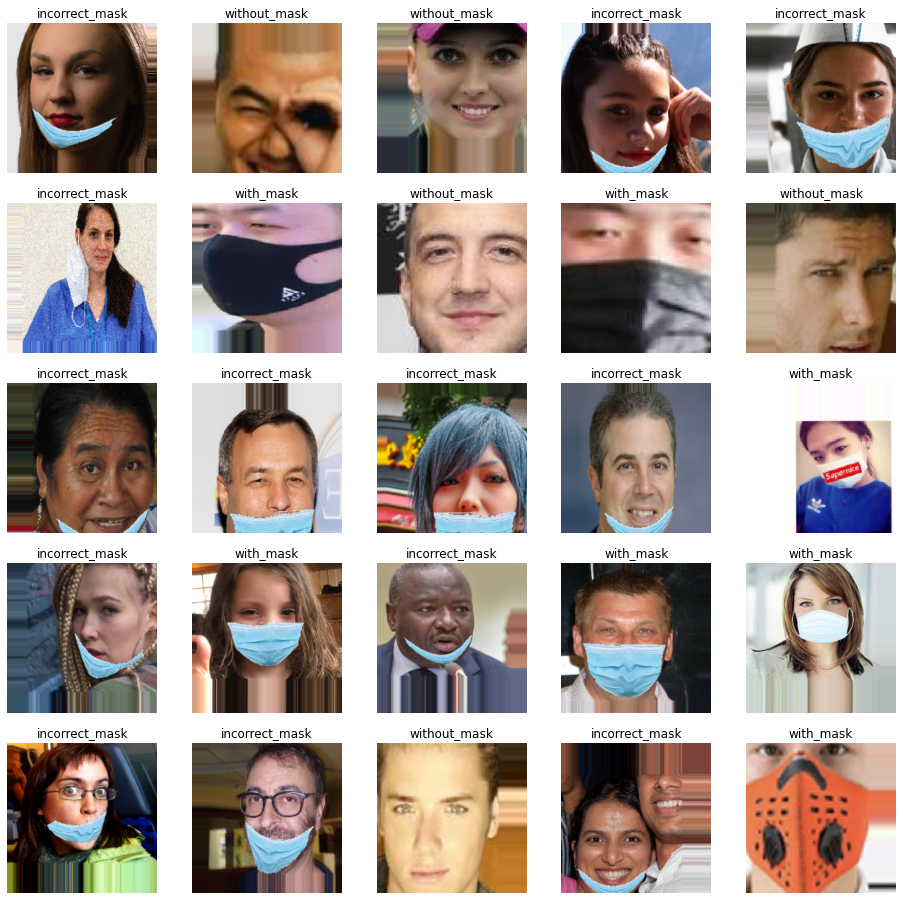

In [9]:
plt.figure(figsize = (16,16))

for i in range(25): #최대 25
  image,label = train_data.next()

  plt.subplot(5,5,i+1)
  plt.imshow(image[i])
  plt.title(labels[tf.argmax(label[i])])
  plt.axis("off")

In [10]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(224,224,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),

                              layers.Dense(3, activation= "softmax")
])

In [11]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 223, 223, 64)      832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 111, 111, 64)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 110, 110, 64)      16448     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 55, 55, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 54, 54, 64)        16448     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 27, 27, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 46656)             0

In [12]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [13]:
# fitting data to the model

hist = model.fit(train_data,
       epochs = 100,
       steps_per_epoch = len(train_data),
       validation_data = test_data,
       validation_steps = len(test_data))

Epoch 1/100
109/509 [=====>........................] - ETA: 2:39 - loss: 0.8831 - accuracy: 0.5983

C:\Users\NIPA_ICTCoC\anaconda3\envs\tsf\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


509/509 [==============================] - 220s 433ms/step - loss: 0.6268 - accuracy: 0.7335 - val_loss: 0.4870 - val_accuracy: 0.7960
Epoch 2/100
509/509 [==============================] - 220s 432ms/step - loss: 0.4453 - accuracy: 0.8233 - val_loss: 0.3008 - val_accuracy: 0.8954
Epoch 3/100
509/509 [==============================] - 219s 431ms/step - loss: 0.3810 - accuracy: 0.8533 - val_loss: 0.3126 - val_accuracy: 0.8990
Epoch 4/100
509/509 [==============================] - 220s 432ms/step - loss: 0.3393 - accuracy: 0.8725 - val_loss: 0.4249 - val_accuracy: 0.8297
Epoch 5/100
509/509 [==============================] - 219s 431ms/step - loss: 0.3105 - accuracy: 0.8867 - val_loss: 0.3394 - val_accuracy: 0.8752
Epoch 6/100
509/509 [==============================] - 226s 445ms/step - loss: 0.2822 - accuracy: 0.8994 - val_loss: 0.2476 - val_accuracy: 0.9027
Epoch 7/100
509/509 [==============================] - 230s 451ms/step - loss: 0.2585 - accuracy: 0.9085 - val_loss: 0.2926 - val_

In [14]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

104/104 [==============================] - 14s 138ms/step - loss: 0.1297 - accuracy: 0.9602
Model Accuracy:  96.02 %


In [ ]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

# fitting data to the model

hist = model.fit(train_data,
       epochs = 100,
       steps_per_epoch = len(train_data),
       validation_data = test_data,
       validation_steps = len(test_data))

model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

In [12]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [13]:
# fitting data to the model

hist = model.fit(train_data,
       epochs = 100,
       steps_per_epoch = len(train_data),
       validation_data = test_data,
       validation_steps = len(test_data))

Epoch 1/100
109/509 [=====>........................] - ETA: 2:39 - loss: 0.8831 - accuracy: 0.5983

C:\Users\NIPA_ICTCoC\anaconda3\envs\tsf\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


509/509 [==============================] - 220s 433ms/step - loss: 0.6268 - accuracy: 0.7335 - val_loss: 0.4870 - val_accuracy: 0.7960
Epoch 2/100
509/509 [==============================] - 220s 432ms/step - loss: 0.4453 - accuracy: 0.8233 - val_loss: 0.3008 - val_accuracy: 0.8954
Epoch 3/100
509/509 [==============================] - 219s 431ms/step - loss: 0.3810 - accuracy: 0.8533 - val_loss: 0.3126 - val_accuracy: 0.8990
Epoch 4/100
509/509 [==============================] - 220s 432ms/step - loss: 0.3393 - accuracy: 0.8725 - val_loss: 0.4249 - val_accuracy: 0.8297
Epoch 5/100
509/509 [==============================] - 219s 431ms/step - loss: 0.3105 - accuracy: 0.8867 - val_loss: 0.3394 - val_accuracy: 0.8752
Epoch 6/100
509/509 [==============================] - 226s 445ms/step - loss: 0.2822 - accuracy: 0.8994 - val_loss: 0.2476 - val_accuracy: 0.9027
Epoch 7/100
509/509 [==============================] - 230s 451ms/step - loss: 0.2585 - accuracy: 0.9085 - val_loss: 0.2926 - val_

In [14]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

104/104 [==============================] - 14s 138ms/step - loss: 0.1297 - accuracy: 0.9602
Model Accuracy:  96.02 %


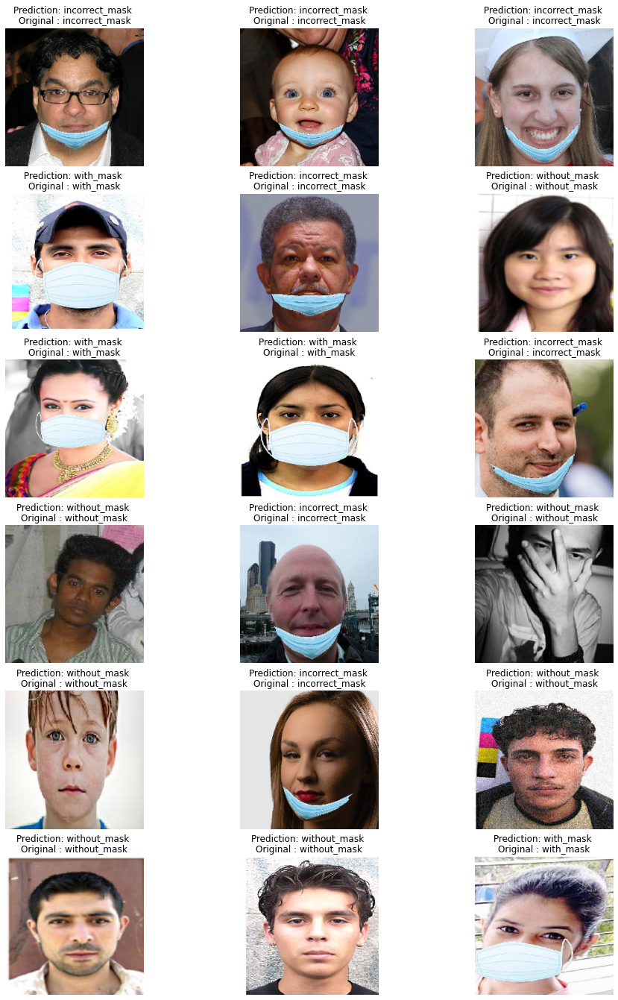

In [15]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
  image, label = test_data.next()

  model_pred = model.predict(image)

  plt.subplot(6,3,i+1)
  plt.imshow(image[i])
  plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
  plt.subplots_adjust(top= 1.25)
  plt.axis("off")


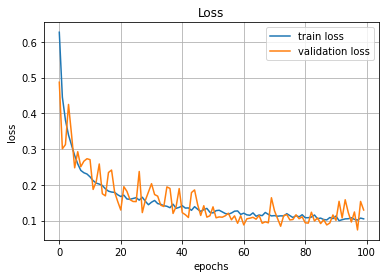

In [17]:
# loss 그래프 출력
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(hist.history['loss'], label='train loss')
plt.plot(hist.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

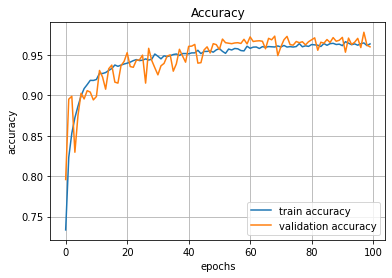

In [18]:
# Accuracy 그래프 출력
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(hist.history['accuracy'], label='train accuracy')
plt.plot(hist.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### Kaggle 원본 데이터 사용
- data : 16269 images
- Conv2D층 추가
- 은닉층 2개(64-32) 추가
- epochs: 90

#### Accuracy: 95.84%

In [8]:
dir = "C:/Ai/project/dataset/FacemaskDetector/dataset" #원본 이미지 폴더

In [10]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               rotation_range=0.2, #random
                               width_shift_range=0.2, #좌우 이동
                               height_shift_range=0.2, #상하 이동
                               zoom_range = 0.2, 
                               horizontal_flip=True,
                               validation_split = 0.02)

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2) #train:test = 8:2

In [11]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (224,224),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (224,224),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 16269 images belonging to 3 classes.
Found 3318 images belonging to 3 classes.


In [12]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

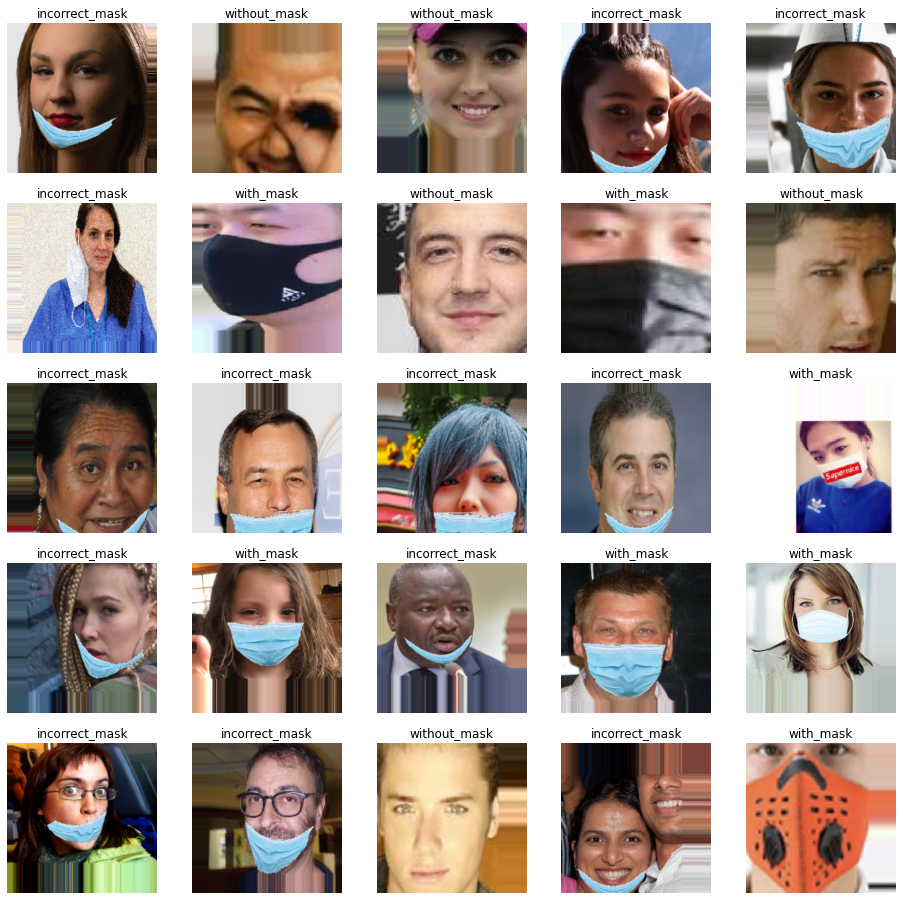

In [13]:
plt.figure(figsize = (16,16))

for i in range(25): #최대 25
  image,label = train_data.next()

  plt.subplot(5,5,i+1)
  plt.imshow(image[i])
  plt.title(labels[tf.argmax(label[i])])
  plt.axis("off")

In [14]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(224,224,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),
    
                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),
    
                              layers.Dense(64, activation="relu"),
                              layers.Dropout(0.5),
    
                              layers.Dense(32, activation="relu"),
                              layers.Dropout(0.5),
    
    
                              layers.Dense(3, activation= "softmax")
])

In [15]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 223, 223, 64)      832       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 111, 111, 64)      0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 110, 110, 64)      16448     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 55, 55, 64)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 54, 54, 64)        16448     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 27, 27, 64)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 26, 26, 64)       

In [16]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [17]:
# fitting data to the model

hist = model.fit(train_data,
       epochs = 90,
       steps_per_epoch = len(train_data),
       validation_data = test_data,
       validation_steps = len(test_data))

Epoch 1/90
506/509 [============================>.] - ETA: 1s - loss: 0.7843 - accuracy: 0.6461

C:\Users\NIPA_ICTCoC\anaconda3\envs\tsf\lib\site-packages\PIL\Image.py:959: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


509/509 [==============================] - 219s 430ms/step - loss: 0.7826 - accuracy: 0.6471 - val_loss: 0.4773 - val_accuracy: 0.8550
Epoch 2/90
509/509 [==============================] - 219s 430ms/step - loss: 0.4935 - accuracy: 0.8186 - val_loss: 0.3722 - val_accuracy: 0.8927
Epoch 3/90
509/509 [==============================] - 218s 429ms/step - loss: 0.4170 - accuracy: 0.8565 - val_loss: 0.2937 - val_accuracy: 0.9027
Epoch 4/90
509/509 [==============================] - 218s 428ms/step - loss: 0.3591 - accuracy: 0.8766 - val_loss: 0.3159 - val_accuracy: 0.8978
Epoch 5/90
509/509 [==============================] - 217s 426ms/step - loss: 0.3365 - accuracy: 0.8881 - val_loss: 0.3068 - val_accuracy: 0.8942
Epoch 6/90
509/509 [==============================] - 219s 430ms/step - loss: 0.3038 - accuracy: 0.9001 - val_loss: 0.2602 - val_accuracy: 0.9090
Epoch 7/90
509/509 [==============================] - 218s 429ms/step - loss: 0.2978 - accuracy: 0.9037 - val_loss: 0.2252 - val_accura

Epoch 57/90
509/509 [==============================] - 218s 428ms/step - loss: 0.1425 - accuracy: 0.9539 - val_loss: 0.1586 - val_accuracy: 0.9500
Epoch 58/90
509/509 [==============================] - 218s 427ms/step - loss: 0.1380 - accuracy: 0.9565 - val_loss: 0.1233 - val_accuracy: 0.9635
Epoch 59/90
509/509 [==============================] - 218s 428ms/step - loss: 0.1405 - accuracy: 0.9559 - val_loss: 0.1128 - val_accuracy: 0.9662
Epoch 60/90
509/509 [==============================] - 216s 424ms/step - loss: 0.1407 - accuracy: 0.9563 - val_loss: 0.1206 - val_accuracy: 0.9620
Epoch 61/90
509/509 [==============================] - 220s 431ms/step - loss: 0.1457 - accuracy: 0.9538 - val_loss: 0.1386 - val_accuracy: 0.9599
Epoch 62/90
509/509 [==============================] - 218s 428ms/step - loss: 0.1357 - accuracy: 0.9563 - val_loss: 0.1793 - val_accuracy: 0.9482
Epoch 63/90
509/509 [==============================] - 219s 430ms/step - loss: 0.1399 - accuracy: 0.9552 - val_loss: 0

In [18]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

104/104 [==============================] - 14s 137ms/step - loss: 0.1392 - accuracy: 0.9584
Model Accuracy:  95.84 %


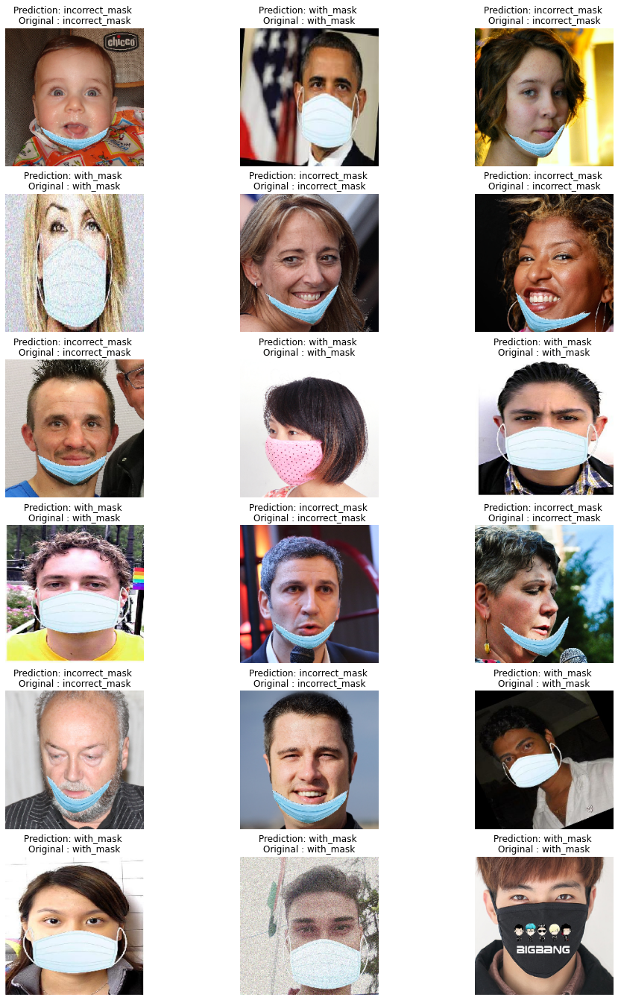

In [19]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
  image, label = test_data.next()

  model_pred = model.predict(image)

  plt.subplot(6,3,i+1)
  plt.imshow(image[i])
  plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
  plt.subplots_adjust(top= 1.25)
  plt.axis("off")


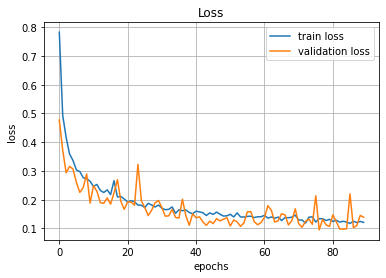

In [20]:
# loss 그래프 출력
plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(hist.history['loss'], label='train loss')
plt.plot(hist.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

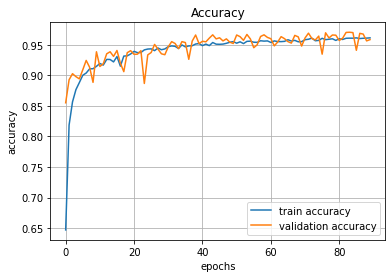

In [21]:
# Accuracy 그래프 출력
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(hist.history['accuracy'], label='train accuracy')
plt.plot(hist.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### <전처리>
### Kaggle 데이터 얼굴 인식 후 180*180 크기로 자르기

#### 1. incorrect_mask

In [2]:
path_dir = "C:/Users/ICTCOC/Downloads/datasett/incorrect_mask/"
file_list = os.listdir(path_dir)

In [3]:
#얼굴 위치 인식하여 사진 자르기
def Cutting_face_save(image, name):
    face_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_eye.xml')
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 3) #scaleFactor: 영상 축소 비율. 기본값 1.1 / minNeighbors: 몇개의 이웃 사각형이 검출되어야 최종 검출 영역으로 설정할지를 지정. 기본값 3
    for (x,y,w,h) in faces:
        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,0),2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = image[y:y+h, x:x+w]
        cropped = image[y: y+h, x: x+w] 
        resize = cv2.resize(cropped, (180,180))
        eyes = eye_cascade.detectMultiScale(roi_gray)
        cv2.imwrite(f"C:/Users/ICTCOC/Downloads/datasett_cut/incorrect_mask/+{name}.jpg", resize) # 이미지 저장하기

In [115]:
for name in file_list:
    img = cv2.imread("C:/Users/ICTCOC/Downloads/datasett/incorrect_mask/"+name) #파일 위치, name:*.jpg
    Cutting_face_save(img, name)
    print(name)

1.jpg
10.jpg
100.jpg
1000.jpg
1001.jpg
1002.jpg
1003.jpg
1004.jpg
1005.jpg
1006.jpg
1007.jpg
1008.jpg
1009.jpg
101.jpg
1010.jpg
1011.jpg
1012.jpg
1013.jpg
1014.jpg
1015.jpg
1016.jpg
1017.jpg
1018.jpg
1019.jpg
102.jpg
1020.jpg
1021.jpg
1022.jpg
1023.jpg
1024.jpg
1025.jpg
1026.jpg
1027.jpg
1028.jpg
1029.jpg
103.jpg
1030.jpg
1031.jpg
1032.jpg
1033.jpg
1034.jpg
1035.jpg
1036.jpg
1037.jpg
1038.jpg
1039.jpg
104.jpg
1040.jpg
1041.jpg
1042.jpg
1043.jpg
1044.jpg
1045.jpg
1046.jpg
1047.jpg
1048.jpg
1049.jpg
105.jpg
1050.jpg
1051.jpg
1052.jpg
1053.jpg
1054.jpg
1055.jpg
1056.jpg
1057.jpg
1058.jpg
1059.jpg
106.jpg
1060.jpg
1061.jpg
1062.jpg
1063.jpg
1064.jpg
1065.jpg
1066.jpg
1067.jpg
1068.jpg
1069.jpg
107.jpg
1070.jpg
1071.jpg
1072.jpg
1073.jpg
1074.jpg
1075.jpg
1076.jpg
1077.jpg
1078.jpg
1079.jpg
108.jpg
1080.jpg
1081.jpg
1082.jpg
1083.jpg
1084.jpg
1085.jpg
1086.jpg
1087.jpg
1088.jpg
1089.jpg
109.jpg
1090.jpg
1091.jpg
1092.jpg
1093.jpg
1094.jpg
1095.jpg
1096.jpg
1097.jpg
1098.jpg
1099.jpg
11.jpg


#### 2. with_mask

In [ ]:
path_dir = "C:/Users/ICTCOC/Downloads/datasett/with_mask/"
file_list = os.listdir(path_dir)

In [116]:
#얼굴 위치 인식하여 사진 자르기
def Cutting_face_save(image, name):
    face_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_eye.xml')
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 3) #scaleFactor: 영상 축소 비율. 기본값 1.1 / minNeighbors: 몇개의 이웃 사각형이 검출되어야 최종 검출 영역으로 설정할지를 지정. 기본값 3
    for (x,y,w,h) in faces:
        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,0),2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = image[y:y+h, x:x+w]
        cropped = image[y: y+h, x: x+w] 
        resize = cv2.resize(cropped, (180,180))
        eyes = eye_cascade.detectMultiScale(roi_gray)
        cv2.imwrite(f"C:/Users/ICTCOC/Downloads/datasett_cut/with_mask/+{name}.jpg", resize) # 이미지 저장하기
        
for name in file_list:
    img = cv2.imread("C:/Users/ICTCOC/Downloads/datasett/with_mask/"+name) #파일 위치, name:*.jpg
    Cutting_face_save(img, name)
    print(name)

0-with-mask.jpg
1-with-mask.jpg
10-with-mask.jpg
100-with-mask.jpg
101-with-mask.jpg
103-with-mask.jpg
104-with-mask.jpg
105-with-mask.jpg
106-with-mask.jpg
107-with-mask.jpg
108-with-mask.jpg
109-with-mask.jpg
11-with-mask.jpg
110-with-mask.jpg
111-with-mask.jpg
112-with-mask.jpg
113-with-mask.jpg
114-with-mask.jpg
115-with-mask.jpg
116-with-mask.jpg
117-with-mask.jpg
118-with-mask.jpg
119-with-mask.jpg
12-with-mask.jpg
120-with-mask.jpg
121-with-mask.jpg
122-with-mask.jpg
123-with-mask.jpg
124-with-mask.jpg
125-with-mask.jpg
126-with-mask.jpg
127-with-mask.jpg
128-with-mask.jpg
129-with-mask.jpg
13-with-mask.jpg
131-with-mask.jpg
132-with-mask.jpg
133-with-mask.jpg
134-with-mask.jpg
135-with-mask.jpg
136-with-mask.jpg
137-with-mask.jpg
138-with-mask.jpg
139-with-mask.jpg
14-with-mask.jpg
140-with-mask.jpg
141-with-mask.jpg
143-with-mask.jpg
144-with-mask.jpg
146-with-mask.jpg
147-with-mask.jpg
148-with-mask.jpg
15-with-mask.jpg
150-with-mask.jpg
151-with-mask.jpg
152-with-mask.jpg
15

#### 3. without_mask

In [ ]:
path_dir = "C:/Users/ICTCOC/Downloads/datasett/without_mask/"
file_list = os.listdir(path_dir)

In [117]:
#얼굴 위치 인식하여 사진 자르기
def Cutting_face_save(image, name):
    face_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_frontalface_default.xml')
    eye_cascade = cv2.CascadeClassifier('C:/Users/ICTCOC/Downloads/haarcascade_eye.xml')
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 3) #scaleFactor: 영상 축소 비율. 기본값 1.1 / minNeighbors: 몇개의 이웃 사각형이 검출되어야 최종 검출 영역으로 설정할지를 지정. 기본값 3
    for (x,y,w,h) in faces:
        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,0),2)
        roi_gray = gray[y:y+h, x:x+w]
        roi_color = image[y:y+h, x:x+w]
        cropped = image[y: y+h, x: x+w] 
        resize = cv2.resize(cropped, (180,180))
        eyes = eye_cascade.detectMultiScale(roi_gray)
        cv2.imwrite(f"C:/Users/ICTCOC/Downloads/datasett_cut/without_mask/+{name}.jpg", resize) # 이미지 저장하기
        
for name in file_list:
    img = cv2.imread("C:/Users/ICTCOC/Downloads/datasett/without_mask/"+name) #파일 위치, name:*.jpg
    Cutting_face_save(img, name)
    print(name)

0.jpg
1.jpg
10.jpg
100.jpg
101.jpg
102.jpg
104.jpg
105.jpg
106.jpg
107.jpg
108.jpg
109.jpg
11.jpg
110.jpg
111.jpg
112.jpg
114.jpg
115.jpg
116.jpg
117.jpg
118.jpg
119.jpg
12.jpg
120.jpg
122.jpg
123.jpg
124.jpg
125.jpg
127.jpg
128.jpg
129.jpg
13.jpg
130.jpg
131.jpg
132.jpg
133.jpg
134.jpg
135.jpg
136.jpg
137.jpg
138.jpg
139.jpg
14.jpg
140.jpg
141.jpg
142.jpg
143.jpg
145.jpg
146.jpg
148.jpg
149.jpg
15.jpg
151.jpg
152.jpg
153.jpg
154.jpg
155.jpg
156.jpg
157.jpg
158.jpg
159.jpg
16.jpg
160.jpg
161.jpg
162.jpg
163.jpg
164.jpg
166.jpg
168.jpg
169.jpg
17.jpg
170.jpg
171.jpg
172.jpg
173.jpg
174.jpg
175.jpg
176.jpg
177.jpg
178.jpg
179.jpg
18.jpg
180.jpg
181.jpg
183.jpg
184.jpg
185.jpg
186.jpg
187.jpg
188.jpg
19.jpg
191.jpg
192.jpg
193.jpg
194.jpg
195.jpg
196.jpg
197.jpg
198.jpg
2.jpg
20.jpg
201.jpg
203.jpg
204.jpg
206.jpg
207.jpg
208.jpg
210.jpg
211.jpg
212.jpg
213.jpg
214.jpg
215.jpg
216.jpg
217.jpg
218.jpg
22.jpg
220.jpg
221.jpg
222.jpg
223.jpg
224.jpg
225.jpg
226.jpg
227.jpg
228.jpg
229.jpg
23

### Kaggle 가공 데이터 사용
- data : 9461 images
- epochs : 10

#### Accuracy: 94.76%

In [18]:
dir = "D:/Ai/dataset"

In [20]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               #rotation_range=0.2, #random
                               horizontal_flip=True,
                               validation_split = 0.02)

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2)

In [21]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (180,180),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (180,180),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 9461 images belonging to 3 classes.
Found 1928 images belonging to 3 classes.


In [22]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

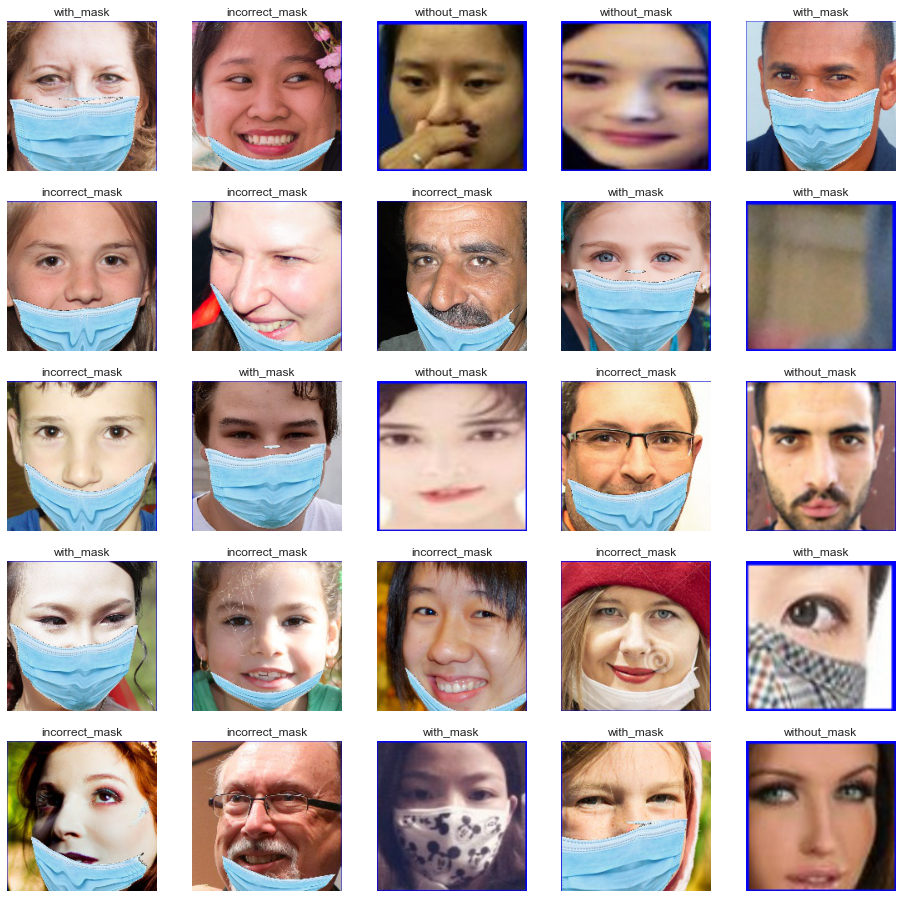

In [23]:
plt.figure(figsize = (16,16))

for i in range(25):
  image,label = train_data.next()

  plt.subplot(5,5,i+1)
  plt.imshow(image[i])
  plt.title(labels[tf.argmax(label[i])])
  plt.axis("off")

In [24]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(180,180,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),

                              layers.Dense(3, activation= "softmax")
])

In [25]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 179, 179, 64)      832       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 89, 89, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 88, 88, 64)        16448     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 43, 43, 64)        16448     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 21, 21, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 28224)            

In [26]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [27]:
# fitting data to the model

hist = model.fit(train_data,
          epochs = 10,
          steps_per_epoch = len(train_data),
          validation_data = test_data,
          validation_steps = len(test_data)
          )

Epoch 1/10
296/296 [==============================] - 107s 361ms/step - loss: 0.3298 - accuracy: 0.8813 - val_loss: 0.2418 - val_accuracy: 0.9139
Epoch 2/10
296/296 [==============================] - 101s 341ms/step - loss: 0.2296 - accuracy: 0.9147 - val_loss: 0.2348 - val_accuracy: 0.9196
Epoch 3/10
296/296 [==============================] - 101s 342ms/step - loss: 0.2097 - accuracy: 0.9214 - val_loss: 0.2017 - val_accuracy: 0.9295
Epoch 4/10
296/296 [==============================] - 102s 345ms/step - loss: 0.1880 - accuracy: 0.9245 - val_loss: 0.1896 - val_accuracy: 0.9170
Epoch 5/10
296/296 [==============================] - 101s 342ms/step - loss: 0.1722 - accuracy: 0.9330 - val_loss: 0.1803 - val_accuracy: 0.9310
Epoch 6/10
296/296 [==============================] - 102s 345ms/step - loss: 0.1558 - accuracy: 0.9347 - val_loss: 0.1604 - val_accuracy: 0.9295
Epoch 7/10
296/296 [==============================] - 102s 346ms/step - loss: 0.1476 - accuracy: 0.9396 - val_loss: 0.1308 -

In [28]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

61/61 [==============================] - 5s 76ms/step - loss: 0.1140 - accuracy: 0.9476
Model Accuracy:  94.76 %


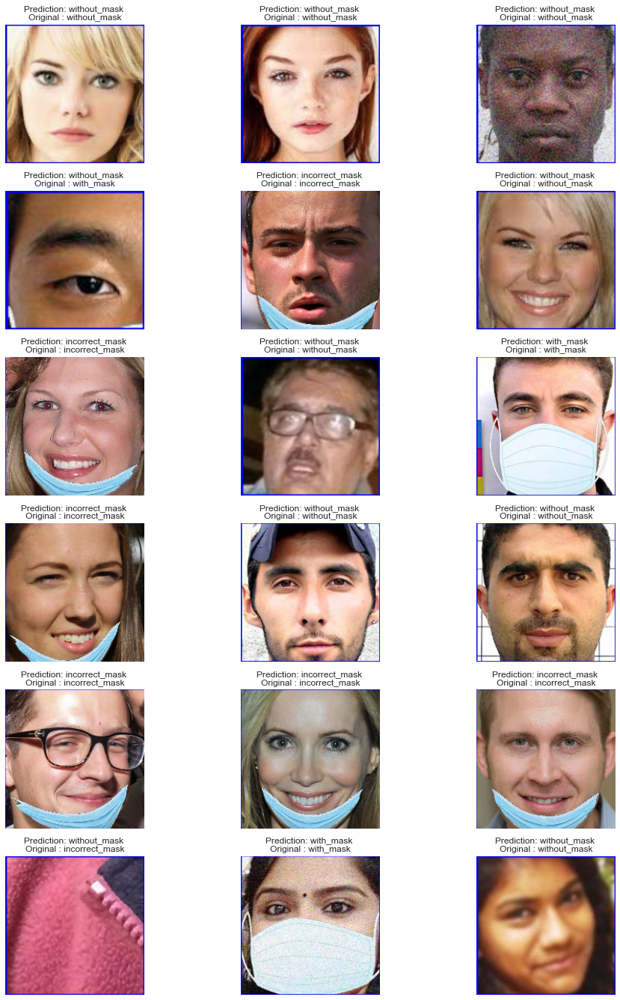

In [29]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
    image, label = test_data.next()

    model_pred = model.predict(image)

    plt.subplot(6,3,i+1)
    plt.imshow(image[i])
    plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
    plt.subplots_adjust(top= 1.25)
    plt.axis("off")

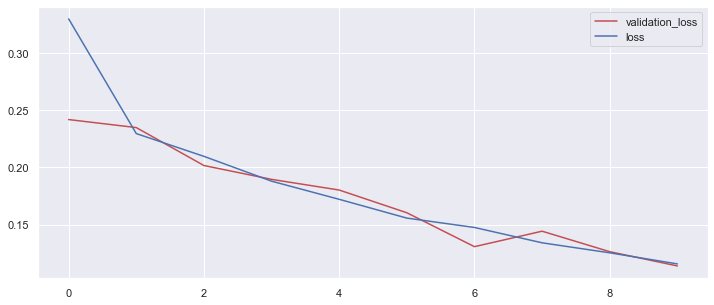

In [30]:
vloss = hist.history['val_loss'] # 테스트셋 loss.
loss = hist.history['loss'] # 학습셋.

plt.figure(figsize=(12,5))
epoch = np.arange(len(loss))
plt.plot(epoch, vloss, 'r', label='validation_loss')
plt.plot(epoch, loss, 'b', label='loss') # 학습셋.
plt.legend(loc='best')
plt.show()

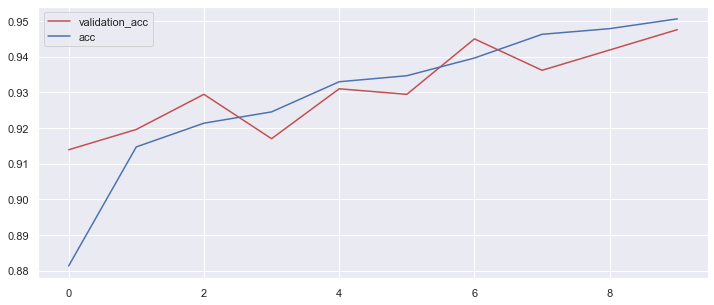

In [33]:
vacc = hist.history['val_accuracy'] # 테스트셋 loss.
acc = hist.history['accuracy'] # 학습셋.

plt.figure(figsize=(12,5))
epoch = np.arange(len(acc))
plt.plot(epoch, vacc, 'r', label='validation_acc')
plt.plot(epoch, acc, 'b', label='acc') # 학습셋.
plt.legend(loc='best')
plt.show()

### Kaggle 가공 데이터 사용
- data : 9456 images
- epochs : 70

#### Accuracy: 99.22%

In [16]:
dir = "C:/ai1/dataset/"

In [22]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               rotation_range=0.2, #random
                               horizontal_flip=True,
                               validation_split = 0.02)

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2)

In [26]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (180,180),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (180,180),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 9461 images belonging to 3 classes.
Found 1928 images belonging to 3 classes.


In [27]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

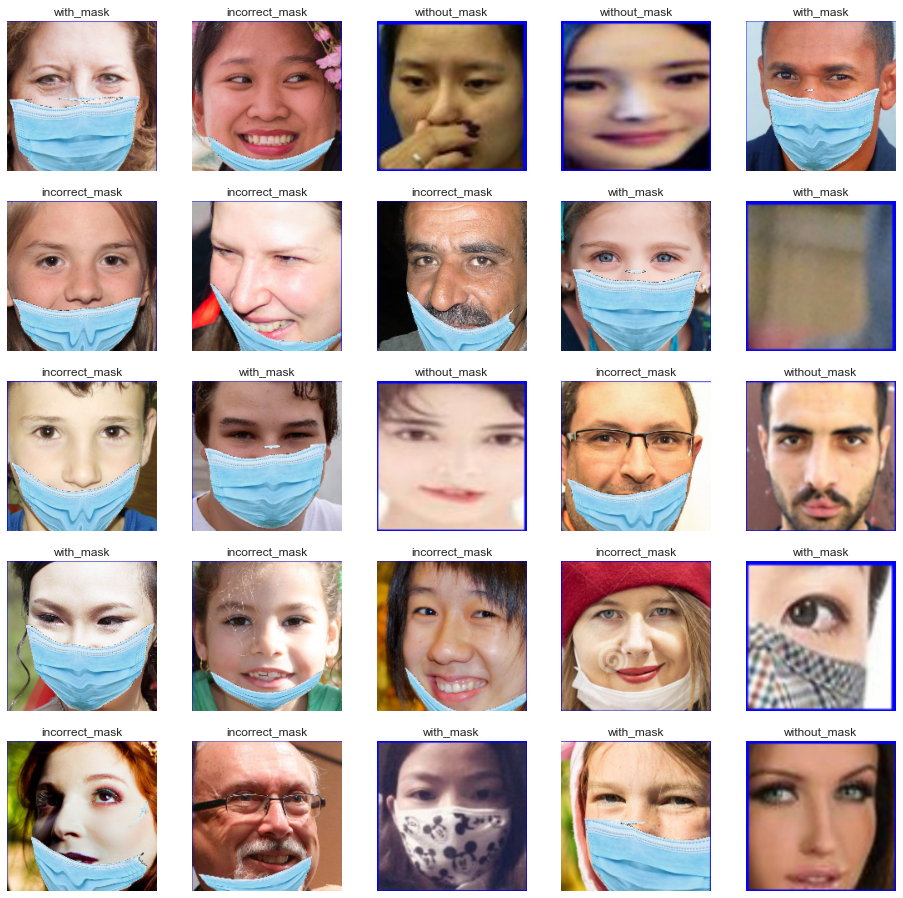

In [28]:
plt.figure(figsize = (16,16))

for i in range(25):
  image,label = train_data.next()

  plt.subplot(5,5,i+1)
  plt.imshow(image[i])
  plt.title(labels[tf.argmax(label[i])])
  plt.axis("off")

In [60]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, strides=(2, 2) activation="relu", input_shape=(180,180,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D( 64,  2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),
    
                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),
    

                              layers.Dense(3, activation= "softmax")
])

In [61]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 179, 179, 64)      832       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 89, 89, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 88, 88, 64)        16448     
_________________________________________________________________
max_pooling2d_17 (MaxPooling (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 43, 43, 64)        16448     
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 21, 21, 64)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 20, 20, 64)       

In [64]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [65]:
# fitting data to the model

hist = model.fit(train_data,
          epochs = 70,
          steps_per_epoch = len(train_data),
          validation_data = test_data,
          validation_steps = len(test_data)
          )

Epoch 1/70
296/296 [==============================] - 126s 426ms/step - loss: 0.3091 - accuracy: 0.8867 - val_loss: 0.2610 - val_accuracy: 0.9087
Epoch 2/70
296/296 [==============================] - 127s 429ms/step - loss: 0.2208 - accuracy: 0.9178 - val_loss: 0.2074 - val_accuracy: 0.9212
Epoch 3/70
296/296 [==============================] - 128s 434ms/step - loss: 0.1789 - accuracy: 0.9264 - val_loss: 0.1840 - val_accuracy: 0.9212
Epoch 4/70
296/296 [==============================] - 128s 433ms/step - loss: 0.1625 - accuracy: 0.9344 - val_loss: 0.1865 - val_accuracy: 0.9201
Epoch 5/70
296/296 [==============================] - 128s 432ms/step - loss: 0.1523 - accuracy: 0.9384 - val_loss: 0.1673 - val_accuracy: 0.9357
Epoch 6/70
296/296 [==============================] - 129s 435ms/step - loss: 0.1372 - accuracy: 0.9422 - val_loss: 0.1373 - val_accuracy: 0.9429
Epoch 7/70
296/296 [==============================] - 128s 431ms/step - loss: 0.1294 - accuracy: 0.9436 - val_loss: 0.1291 -

Epoch 57/70
296/296 [==============================] - 130s 440ms/step - loss: 0.0405 - accuracy: 0.9836 - val_loss: 0.0225 - val_accuracy: 0.9917
Epoch 58/70
296/296 [==============================] - 130s 439ms/step - loss: 0.0335 - accuracy: 0.9857 - val_loss: 0.0203 - val_accuracy: 0.9933
Epoch 59/70
296/296 [==============================] - 130s 439ms/step - loss: 0.0390 - accuracy: 0.9844 - val_loss: 0.0247 - val_accuracy: 0.9917
Epoch 60/70
296/296 [==============================] - 131s 441ms/step - loss: 0.0357 - accuracy: 0.9843 - val_loss: 0.0188 - val_accuracy: 0.9927
Epoch 61/70
296/296 [==============================] - 129s 437ms/step - loss: 0.0403 - accuracy: 0.9848 - val_loss: 0.0207 - val_accuracy: 0.9933
Epoch 62/70
296/296 [==============================] - 129s 436ms/step - loss: 0.0415 - accuracy: 0.9851 - val_loss: 0.0385 - val_accuracy: 0.9865
Epoch 63/70
296/296 [==============================] - 130s 439ms/step - loss: 0.0366 - accuracy: 0.9841 - val_loss: 0

In [66]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

61/61 [==============================] - 7s 108ms/step - loss: 0.0220 - accuracy: 0.9922
Model Accuracy:  99.22 %


In [50]:
type(hist)

tensorflow.python.keras.callbacks.History

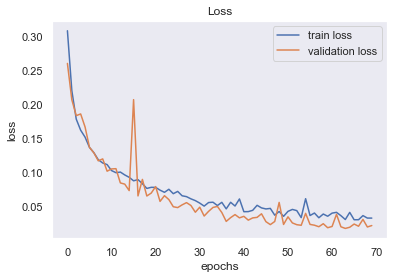

In [67]:
import matplotlib.pyplot as plt

plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(hist.history['loss'], label='train loss')
plt.plot(hist.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

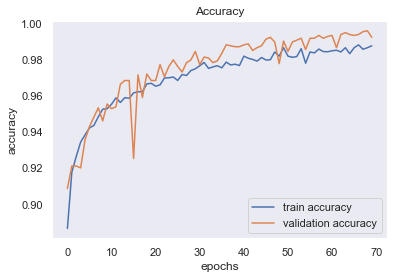

In [68]:
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(hist.history['accuracy'], label='train accuracy')
plt.plot(hist.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### Kaggle 가공 데이터 사용
- data : 9456 images
- epochs : 100

#### Accuracy: 99.79%

In [14]:
dir = "C:/Users/ICTCOC/Downloads/datasett_cut/"

In [16]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               rotation_range=0.2, #random
                               horizontal_flip=True,
                               validation_split = 0.02)

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2) #train:test = 8:2

In [17]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (180,180),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (180,180),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 9456 images belonging to 3 classes.
Found 1927 images belonging to 3 classes.


In [18]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

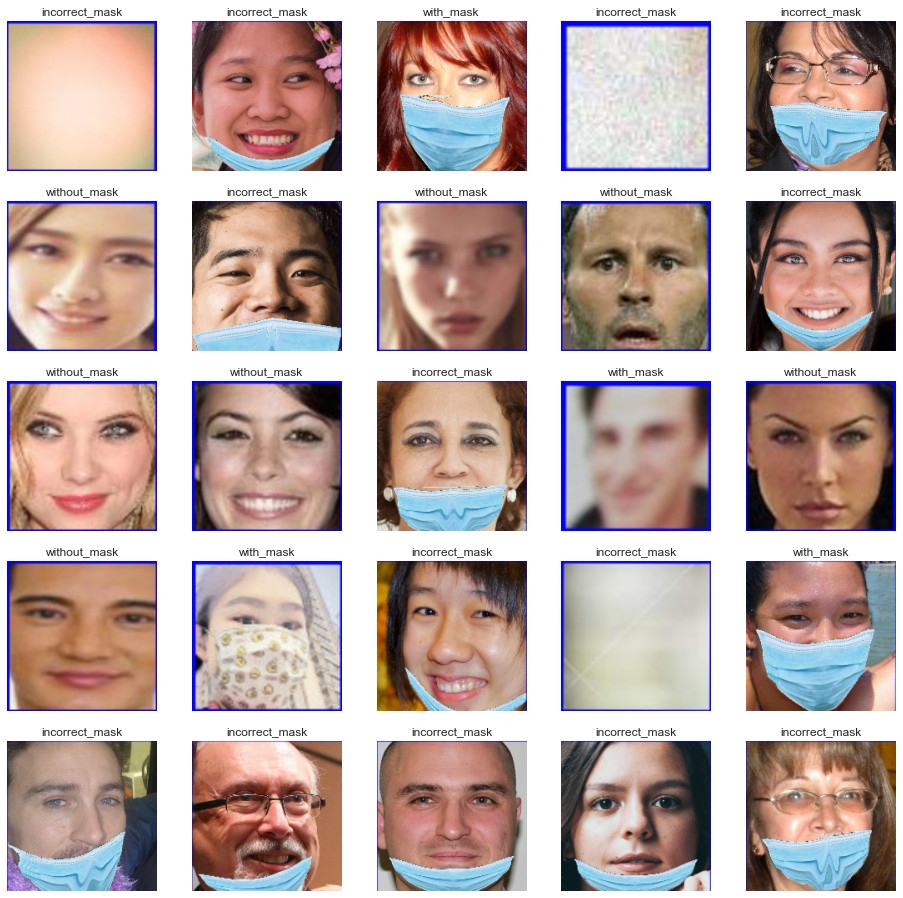

In [19]:
plt.figure(figsize = (16,16))

for i in range(25): #최대 25
    image,label = train_data.next()

    plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(labels[tf.argmax(label[i])])
    plt.axis("off")

In [20]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(180,180,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),

                              layers.Dense(3, activation= "softmax")
])

In [21]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 179, 179, 64)      832       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 89, 89, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 88, 88, 64)        16448     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 43, 43, 64)        16448     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 21, 21, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 28224)            

In [22]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [23]:
# 모델 학습 및 저장.
fit_history = model.fit(train_data,
                        epochs = 100,
                        steps_per_epoch = len(train_data),
                        validation_data = test_data,
                        validation_steps = len(test_data)
                        )

Epoch 1/100
296/296 [==============================] - 134s 452ms/step - loss: 0.3155 - accuracy: 0.8874 - val_loss: 0.2163 - val_accuracy: 0.9206
Epoch 2/100
296/296 [==============================] - 135s 455ms/step - loss: 0.2097 - accuracy: 0.9214 - val_loss: 0.1957 - val_accuracy: 0.9305
Epoch 3/100
296/296 [==============================] - 135s 455ms/step - loss: 0.1810 - accuracy: 0.9278 - val_loss: 0.2593 - val_accuracy: 0.9019
Epoch 4/100
296/296 [==============================] - 134s 453ms/step - loss: 0.1598 - accuracy: 0.9352 - val_loss: 0.1513 - val_accuracy: 0.9367
Epoch 5/100
296/296 [==============================] - 136s 459ms/step - loss: 0.1447 - accuracy: 0.9391 - val_loss: 0.1295 - val_accuracy: 0.9486
Epoch 6/100
296/296 [==============================] - 135s 456ms/step - loss: 0.1342 - accuracy: 0.9449 - val_loss: 0.1271 - val_accuracy: 0.9440
Epoch 7/100
296/296 [==============================] - 135s 458ms/step - loss: 0.1281 - accuracy: 0.9441 - val_loss: 0

In [24]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

61/61 [==============================] - 7s 113ms/step - loss: 0.0141 - accuracy: 0.9979
Model Accuracy:  99.79 %


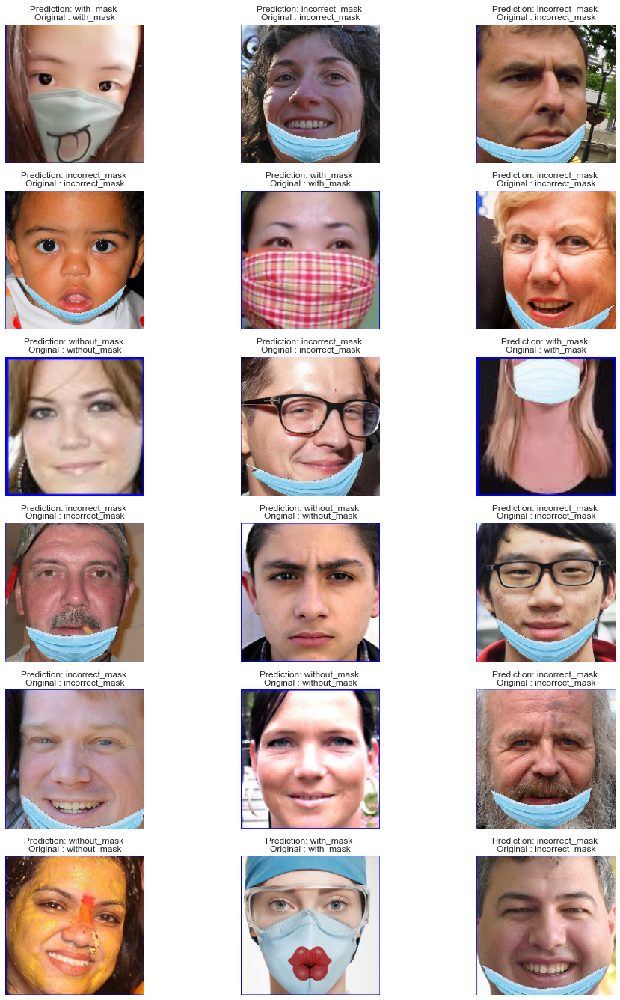

In [25]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
    image, label = test_data.next()

    model_pred = model.predict(image)

    plt.subplot(6,3,i+1)
    plt.imshow(image[i])
    plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
    plt.subplots_adjust(top= 1.25)
    plt.axis("off")

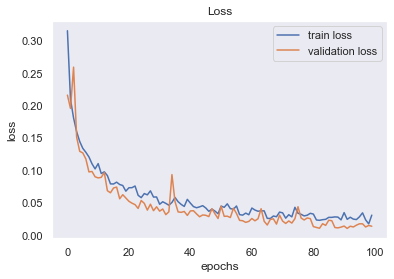

In [28]:
import matplotlib.pyplot as plt

plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(fit_history.history['loss'], label='train loss')
plt.plot(fit_history.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

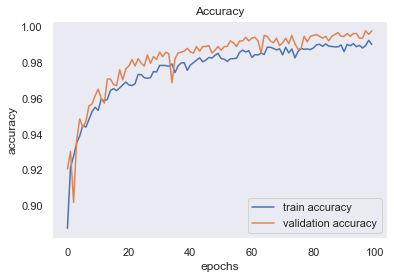

In [29]:
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(fit_history.history['accuracy'], label='train accuracy')
plt.plot(fit_history.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### Kaggle 가공 데이터 사용
- data : 9461 images
- 은닉층 4개(64-32-16-8) 추가
- epochs : 100

#### Accuracy: 97.98%

In [3]:
dir = "D:/Ai/dataset"

In [5]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               #rotation_range=0.2, #random
                               horizontal_flip=True,
                               validation_split = 0.02) #2%

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2)

In [6]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (180,180),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (180,180),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 9461 images belonging to 3 classes.
Found 1928 images belonging to 3 classes.


In [7]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

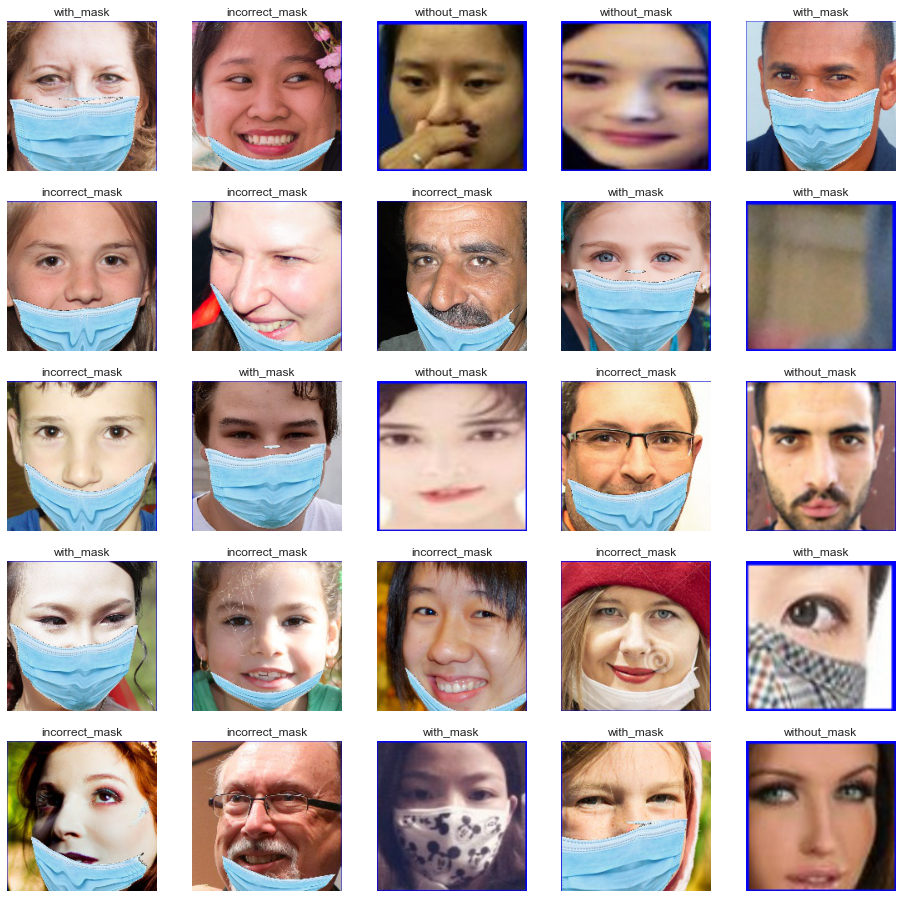

In [8]:
plt.figure(figsize = (16,16))

for i in range(25):
  image,label = train_data.next()

  plt.subplot(5,5,i+1)
  plt.imshow(image[i])
  plt.title(labels[tf.argmax(label[i])])
  plt.axis("off")

In [9]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(180,180,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dense(64, activation="relu"),
                              layers.Dense(32, activation="relu"),
                              layers.Dense(16, activation="relu"),
                              layers.Dense(8, activation="relu"),
                              layers.Dropout(0.5),
    
                                
                              layers.Dense(3, activation= "softmax")
])

In [10]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 179, 179, 64)      832       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 89, 89, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 88, 88, 64)        16448     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 43, 43, 64)        16448     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 21, 21, 64)        0         
_________________________________________________________________
flatten (Flatten)            (None, 28224)             0

In [11]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [12]:
# fitting data to the model

hist = model.fit(train_data,
          epochs = 100,
          steps_per_epoch = len(train_data),
          validation_data = test_data,
          validation_steps = len(test_data)
          )

Epoch 1/100
296/296 [==============================] - 103s 348ms/step - loss: 0.6854 - accuracy: 0.7178 - val_loss: 0.4213 - val_accuracy: 0.8947
Epoch 2/100
296/296 [==============================] - 102s 344ms/step - loss: 0.5619 - accuracy: 0.7707 - val_loss: 0.3576 - val_accuracy: 0.9020
Epoch 3/100
296/296 [==============================] - 103s 348ms/step - loss: 0.4730 - accuracy: 0.7742 - val_loss: 0.2829 - val_accuracy: 0.8849
Epoch 4/100
296/296 [==============================] - 102s 344ms/step - loss: 0.3926 - accuracy: 0.8036 - val_loss: 0.2410 - val_accuracy: 0.9289
Epoch 5/100
296/296 [==============================] - 101s 343ms/step - loss: 0.3614 - accuracy: 0.8478 - val_loss: 0.1930 - val_accuracy: 0.9388
Epoch 6/100
296/296 [==============================] - 103s 347ms/step - loss: 0.3233 - accuracy: 0.8657 - val_loss: 0.1689 - val_accuracy: 0.9372
Epoch 7/100
296/296 [==============================] - 104s 350ms/step - loss: 0.3398 - accuracy: 0.8589 - val_loss: 0

In [13]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

61/61 [==============================] - 5s 75ms/step - loss: 0.0629 - accuracy: 0.9798
Model Accuracy:  97.98 %


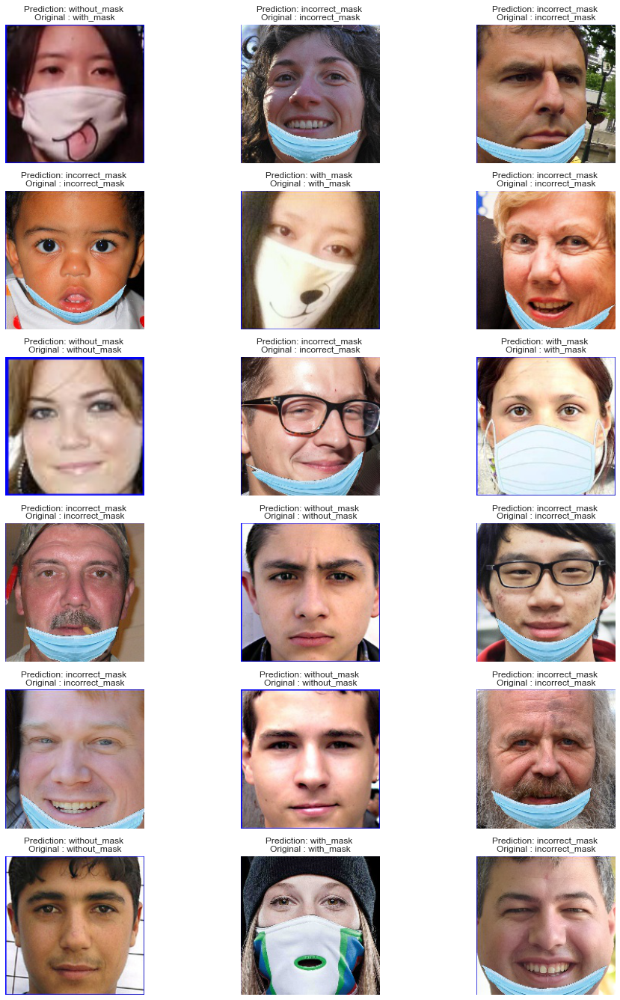

In [14]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
  image, label = test_data.next()

  model_pred = model.predict(image)

  plt.subplot(6,3,i+1)
  plt.imshow(image[i])
  plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
  plt.subplots_adjust(top= 1.25)
  plt.axis("off")


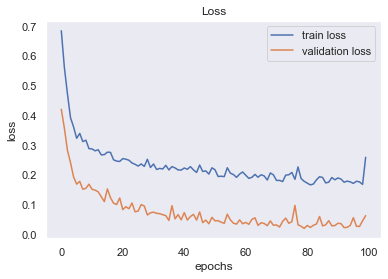

In [22]:
import matplotlib.pyplot as plt

plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(hist.history['loss'], label='train loss')
plt.plot(hist.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

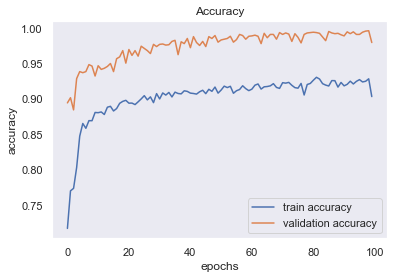

In [23]:
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(hist.history['accuracy'], label='train accuracy')
plt.plot(hist.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### Kaggle 가공 데이터 이상치 제거
- data : 8669 images
- epochs : 100
- epochs 50부터 accuracy가 100%가 됨

#### Accuracy: 100%

In [14]:
dir = "D:/Ai/dataset_cut/"

In [16]:
train_gen = ImageDataGenerator(rescale= 1/255., #0~1사이의 값으로 정규화                                                                                                                   
                               rotation_range=0.2, #random
                               horizontal_flip=True,
                               validation_split = 0.02)

test_gen = ImageDataGenerator(rescale= 1/255.,
                              validation_split = 0.2) #train:test = 8:2

In [17]:
train_data = train_gen.flow_from_directory(dir,
                                           target_size = (180,180),
                                           class_mode = "categorical",
                                           seed = 42,
                                           subset = "training"
                                           )

test_data = test_gen.flow_from_directory(dir,
                                         target_size = (180,180),
                                         class_mode = "categorical",
                                         seed = 42,
                                         subset = "validation"
                                         )

Found 8669 images belonging to 3 classes.
Found 1768 images belonging to 3 classes.


In [18]:
labels = list(train_data.class_indices.keys())

labels

['incorrect_mask', 'with_mask', 'without_mask']

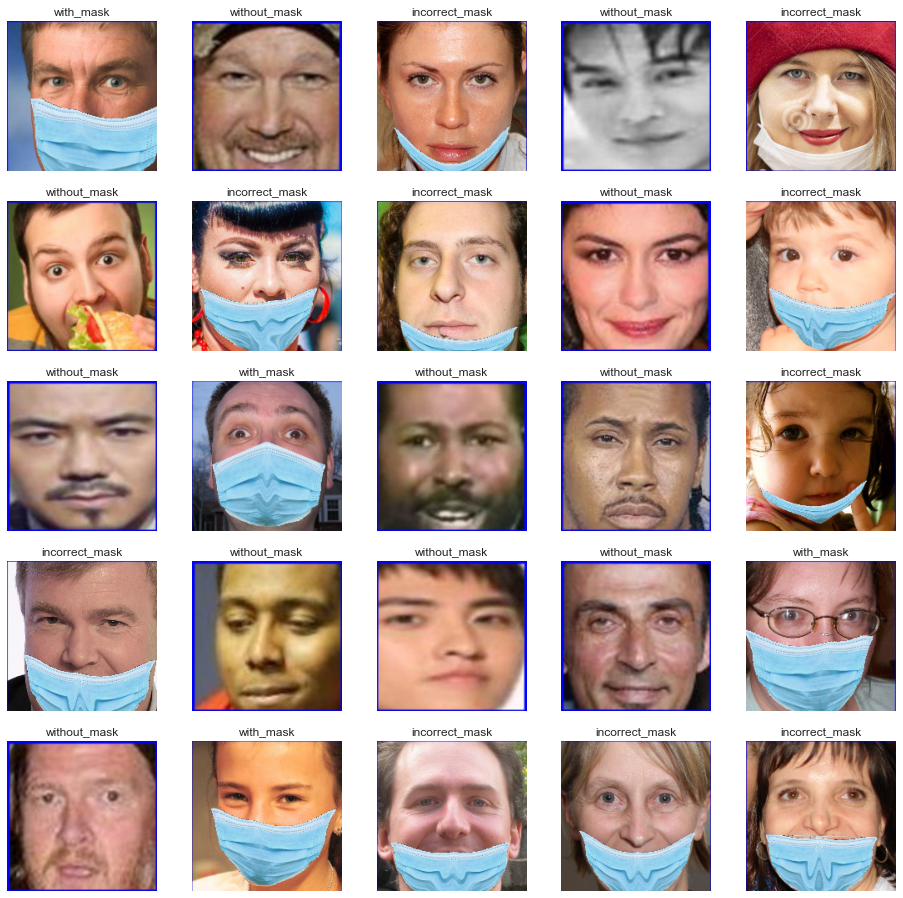

In [19]:
plt.figure(figsize = (16,16))

for i in range(25): #최대 25
    image,label = train_data.next()

    plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.title(labels[tf.argmax(label[i])])
    plt.axis("off")

In [20]:
# Building a CNN model 
import tensorflow as tf
from tensorflow.keras import layers
model  = tf.keras.Sequential([
                              
                              layers.Conv2D(filters= 64, kernel_size= 2, activation="relu", input_shape=(180,180,3)),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Conv2D(filters = 64, kernel_size= 2, activation= "relu"),
                              layers.MaxPooling2D(pool_size= 2),

                              layers.Flatten(),

                              layers.Dense(128, activation="relu"),
                              layers.Dropout(0.5),

                              layers.Dense(3, activation= "softmax")
])

In [21]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 179, 179, 64)      832       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 89, 89, 64)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 88, 88, 64)        16448     
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 44, 44, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 43, 43, 64)        16448     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 21, 21, 64)        0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 28224)            

In [22]:
# compiling the model

model.compile(
    loss = tf.keras.losses.categorical_crossentropy,
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ["accuracy"]
)

In [23]:
# 모델 학습 및 저장.
fit_history = model.fit(train_data,
                        epochs = 100,
                        steps_per_epoch = len(train_data),
                        validation_data = test_data,
                        validation_steps = len(test_data)
                        )

Epoch 1/100
271/271 [==============================] - 94s 345ms/step - loss: 0.1789 - accuracy: 0.9435 - val_loss: 0.1254 - val_accuracy: 0.9615
Epoch 2/100
271/271 [==============================] - 94s 346ms/step - loss: 0.1024 - accuracy: 0.9740 - val_loss: 0.0787 - val_accuracy: 0.9723
Epoch 3/100
271/271 [==============================] - 94s 349ms/step - loss: 0.0890 - accuracy: 0.9765 - val_loss: 0.1426 - val_accuracy: 0.9548
Epoch 4/100
271/271 [==============================] - 94s 348ms/step - loss: 0.0810 - accuracy: 0.9807 - val_loss: 0.0876 - val_accuracy: 0.9796
Epoch 5/100
271/271 [==============================] - 94s 346ms/step - loss: 0.0654 - accuracy: 0.9822 - val_loss: 0.1029 - val_accuracy: 0.9706
Epoch 6/100
271/271 [==============================] - 95s 349ms/step - loss: 0.0587 - accuracy: 0.9839 - val_loss: 0.0450 - val_accuracy: 0.9887
Epoch 7/100
271/271 [==============================] - 93s 345ms/step - loss: 0.0502 - accuracy: 0.9849 - val_loss: 0.0563 -

In [24]:
model_evaluation = model.evaluate(test_data)
print(f"Model Accuracy: {model_evaluation[1] * 100 : 0.2f} %")

56/56 [==============================] - 4s 76ms/step - loss: 2.3399e-04 - accuracy: 1.0000
Model Accuracy:  100.00 %


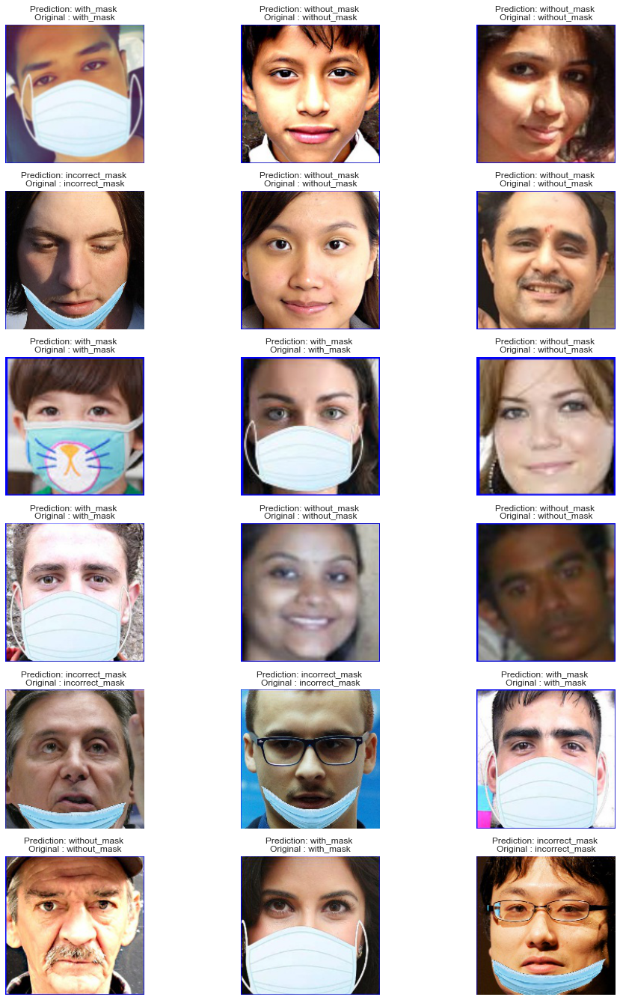

In [25]:
# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(16,16))

for i in range(18):
    image, label = test_data.next()

    model_pred = model.predict(image)

    plt.subplot(6,3,i+1)
    plt.imshow(image[i])
    plt.title(f"Prediction: {labels[tf.argmax(model_pred[i])]} \nOriginal : {labels[tf.argmax(label[i])]}")
    plt.subplots_adjust(top= 1.25)
    plt.axis("off")

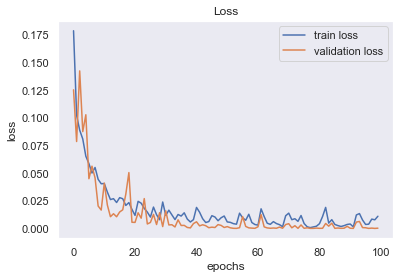

In [31]:
import matplotlib.pyplot as plt

plt.title('Loss')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.grid()

plt.plot(fit_history.history['loss'], label='train loss')
plt.plot(fit_history.history['val_loss'], label='validation loss')

plt.legend(loc='best')
plt.show()

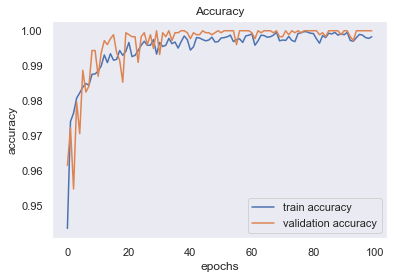

In [32]:
plt.title('Accuracy')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.grid()

plt.plot(fit_history.history['accuracy'], label='train accuracy')
plt.plot(fit_history.history['val_accuracy'], label='validation accuracy')

plt.legend(loc='best')
plt.show()

### 팀원 사진으로 Test

In [ ]:
#모델 저장
model.save('project_cut_a100.h5') #저장할 파일 이름 지정

In [ ]:
#모델 불러오기
path_dir = "C:/Ai/project/picture_cut/"
dile_list = os.listdir(path_dir)
label_list = [2,1,1,1]

# visualizing the test data

import matplotlib.pyplot as plt
import tensorflow as tf

plt.figure(figsize=(12,8))

for i in range(4):
    image, label = plt.imread(path_dir+dile_list[i]), label_list[i]
    image = cv2.resize(image, dsize=(180, 180))
    model_pred = model.predict(np.array([image]))
    
    plt.subplot(2,2,i+1)
    plt.imshow(image)
    plt.title(f"Prediction: {labels[tf.argmax(model_pred[0])]} \nOriginal : {labels[label]}")
    plt.subplots_adjust(top= 1.25)
    plt.axis("off")

In [ ]:
#초상권으로 인해 결과 생략